### Exploring Customer Segmentation


<center>
    <img src = images/segments.jpeg>
</center>


In this activity, you are tasked with profiling customer groups for a large telecommunications company.  The data provided contains information on customers purchasing and useage behavior with the telecom products.  Your goal is to use PCA and clustering to segment these customers into meaningful groups, and report back your findings.  

Because these results need to be interpretable, it is important to keep the number of clusters reasonable.  Think about how you might represent some of the non-numeric features so that they can be included in your segmentation models.  You are to report back your approach and findings to the class.  Be specific about what features were used and how you interpret the resulting clusters.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from sklearn.cluster import KMeans, DBSCAN
from sklearn.decomposition import PCA
import plotly.express as px

In [2]:
df = pd.read_csv('data/telco_churn_data.csv')

In [3]:
pd.set_option('display.max_columns', None)

In [4]:
df.head()

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,City,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
0,8779-QRDMV,No,0,1,None,No,0.00,No,Yes,Fiber Optic,9,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,41.236,39.65,0.00,0.0,0.00,Male,78,No,Yes,No,No,0,Los Angeles,90022,34.023810,-118.156582,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN
1,7495-OOKFY,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,19,No,Yes,No,No,No,No,No,No,Month-to-Month,Yes,Credit Card,83.876,633.30,0.00,120.0,390.80,Female,74,No,Yes,Yes,Yes,1,Los Angeles,90063,34.044271,-118.185237,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN
2,1658-BYGOY,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,57,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,99.268,1752.55,45.61,0.0,203.94,Male,71,No,Yes,No,Yes,3,Los Angeles,90065,34.108833,-118.229715,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN
3,4598-XLKNJ,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,13,No,Yes,Yes,No,Yes,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,102.440,2514.50,13.43,327.0,494.00,Female,78,No,Yes,Yes,Yes,1,Inglewood,90303,33.936291,-118.332639,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0
4,4846-WHAFZ,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,15,No,No,No,No,No,No,No,No,Month-to-Month,Yes,Bank Withdrawal,79.560,2868.15,0.00,430.0,234.21,Female,80,No,Yes,Yes,Yes,1,Whittier,90602,33.972119,-118.020188,26265,1,2793,Price,Extra data charges,1,0,2.0


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Referred a Friend                  7043 non-null   object 
 2   Number of Referrals                7043 non-null   int64  
 3   Tenure in Months                   7043 non-null   int64  
 4   Offer                              7043 non-null   object 
 5   Phone Service                      7043 non-null   object 
 6   Avg Monthly Long Distance Charges  7043 non-null   float64
 7   Multiple Lines                     7043 non-null   object 
 8   Internet Service                   7043 non-null   object 
 9   Internet Type                      7043 non-null   object 
 10  Avg Monthly GB Download            7043 non-null   int64  
 11  Online Security                    7043 non-null   objec

In [6]:
df.describe()

,Number of Referrals,Tenure in Months,Avg Monthly Long Distance Charges,Avg Monthly GB Download,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Age,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,1834.000000
mean,1.951867,32.386767,22.958954,21.110890,65.538800,2280.381264,1.962182,278.499225,749.099262,46.509726,0.468692,93486.070567,36.197455,-119.756684,22139.603294,0.265370,4400.295755,1.338776,0.308107,3.005453
std,3.001199,24.542061,15.448113,20.948471,30.606805,2266.220462,7.902614,685.039625,846.660055,16.750352,0.962802,1856.767505,2.468929,2.154425,21152.392837,0.441561,1183.057152,1.430471,0.717514,1.256938
min,0.000000,1.000000,0.000000,0.000000,18.250000,18.800000,0.000000,0.000000,0.000000,19.000000,0.000000,90001.000000,32.555828,-124.301372,11.000000,0.000000,2003.000000,0.000000,0.000000,1.000000
25%,0.000000,9.000000,9.210000,3.000000,35.890000,400.150000,0.000000,0.000000,70.545000,32.000000,0.000000,92101.000000,33.990646,-121.788090,2344.000000,0.000000,3469.000000,0.000000,0.000000,2.000000
50%,0.000000,29.000000,22.890000,17.000000,71.968000,1394.550000,0.000000,0.000000,401.440000,46.000000,0.000000,93518.000000,36.205465,-119.595293,17554.000000,0.000000,4527.000000,1.000000,0.000000,3.000000
75%,3.000000,55.000000,36.395000,28.000000,90.650000,3786.600000,0.000000,182.620000,1191.100000,60.000000,0.000000,95329.000000,38.161321,-117.969795,36125.000000,1.000000,5380.500000,2.000000,0.000000,4.000000
max,11.000000,72.000000,49.990000,94.000000,123.084000,8684.800000,49.790000,6477.000000,3564.720000,80.000000,9.000000,96150.000000,41.962127,-114.192901,105285.000000,1.000000,6500.000000,9.000000,6.000000,5.000000


## Data Cleanup and Transformation
Copy it to df_clean
 - Transform all Yes/No columns to 1/0
 - Gender Male/Female to 1/0
 - Analyze columns Offer, Internet Type, Contract, Payment Method, Churn Category and Churn Reason
 - Fill null Customer Satisfaction with mean value 3.005453
 - Fill null Churn Reason with ‘Don't know’
 - Fill null Churn Category with ‘Other’
 - Set index to Customer ID
 - Drop column City since there is zip code and latitude & longitude
 - Drop dependents since there is number of dependents
 - Drop Under 30 and Senior Citizen since there is Age column

In [7]:
df_clean = df

In [8]:
def YNto10(X, column):
    X.loc[X[column] == 'Yes', column] = 1
    X.loc[X[column] == 'No', column] = 0
    X[column] = pd.to_numeric(X[column])

In [9]:
df_clean

,Customer ID,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents,City,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
0,8779-QRDMV,No,0,1,None,No,0.00,No,Yes,Fiber Optic,9,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,41.236,39.65,0.00,0.0,0.00,Male,78,No,Yes,No,No,0,Los Angeles,90022,34.023810,-118.156582,68701,1,5433,Competitor,Competitor offered more data,5,0,NaN
1,7495-OOKFY,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Cable,19,No,Yes,No,No,No,No,No,No,Month-to-Month,Yes,Credit Card,83.876,633.30,0.00,120.0,390.80,Female,74,No,Yes,Yes,Yes,1,Los Angeles,90063,34.044271,-118.185237,55668,1,5302,Competitor,Competitor made better offer,5,0,NaN
2,1658-BYGOY,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,57,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,99.268,1752.55,45.61,0.0,203.94,Male,71,No,Yes,No,Yes,3,Los Angeles,90065,34.108833,-118.229715,47534,1,3179,Competitor,Competitor made better offer,1,0,NaN
3,4598-XLKNJ,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,13,No,Yes,Yes,No,Yes,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,102.440,2514.50,13.43,327.0,494.00,Female,78,No,Yes,Yes,Yes,1,Inglewood,90303,33.936291,-118.332639,27778,1,5337,Dissatisfaction,Limited range of services,1,1,2.0
4,4846-WHAFZ,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Cable,15,No,No,No,No,No,No,No,No,Month-to-Month,Yes,Bank Withdrawal,79.560,2868.15,0.00,430.0,234.21,Female,80,No,Yes,Yes,Yes,1,Whittier,90602,33.972119,-118.020188,26265,1,2793,Price,Extra data charges,1,0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,2569-WGERO,No,0,72,None,Yes,22.77,No,No,None,0,No,No,No,No,No,No,No,No,Two Year,Yes,Bank Withdrawal,21.150,1419.40,19.31,0.0,1639.44,Female,30,No,No,No,No,0,Landers,92285,34.341737,-116.539416,2182,0,5306,NaN,NaN,0,0,NaN
7039,6840-RESVB,Yes,1,24,Offer C,Yes,36.05,Yes,Yes,DSL,24,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,One Year,Yes,Mailed Check,84.800,1990.50,48.23,0.0,865.20,Male,38,No,No,Yes,Yes,2,Adelanto,92301,34.667815,-117.536183,18980,0,2140,NaN,NaN,2,0,NaN
7040,2234-XADUH,Yes,4,72,None,Yes,29.66,Yes,Yes,Cable,59,No,Yes,Yes,No,Yes,Yes,Yes,No,One Year,Yes,Credit Card,103.200,7362.90,45.38,4344.0,2135.52,Female,30,No,No,Yes,Yes,2,Amboy,92304,34.559882,-115.637164,42,0,5560,NaN,NaN,2,0,4.0
7041,4801-JZAZL,Yes,1,11,None,No,0.00,No,Yes,DSL,17,Yes,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,29.600,346.45,27.24,0.0,0.00,Female,32,No,No,Yes,Yes,2,Angelus Oaks,92305,34.167800,-116.864330,301,0,2793,NaN,NaN,0,0,NaN


In [10]:
# set index to Customer ID
df_clean = df_clean.set_index('Customer ID')

In [11]:
# Gender
df_clean.loc[df_clean['Gender'] == 'Male', 'Gender'] = 1
df_clean.loc[df_clean['Gender'] == 'Female', 'Gender'] = 0
df_clean['Gender'] = pd.to_numeric(df_clean['Gender'])

In [12]:
# Fix nan in 'Churn Reason'
df_clean['Churn Reason']=df_clean['Churn Reason'].fillna("Don't know")

In [13]:
# Fill with numeric equivalent
i=0
for reason in df_clean['Churn Reason'].value_counts().keys().tolist():
    i = i + 1
    print(reason, 'to', str(i))
    df_clean.loc[df_clean['Churn Reason'] == reason, 'Churn Reason'] = i
df_clean['Churn Reason'] = pd.to_numeric(df_clean['Churn Reason'])

Don't know to 1
Competitor had better devices to 2
Competitor made better offer to 3
Attitude of support person to 4
Competitor offered more data to 5
Competitor offered higher download speeds to 6
Attitude of service provider to 7
Price too high to 8
Product dissatisfaction to 9
Network reliability to 10
Long distance charges to 11
Service dissatisfaction to 12
Moved to 13
Extra data charges to 14
Limited range of services to 15
Poor expertise of online support to 16
Lack of affordable download/upload speed to 17
Lack of self-service on Website to 18
Poor expertise of phone support to 19
Deceased to 20


In [14]:
# Fix nan in 'Churn Category'
df_clean['Churn Category']=df_clean['Churn Category'].fillna("Other")

In [15]:
# Fix nan in 'Customer Satisfaction'
df_clean['Customer Satisfaction']=df_clean['Customer Satisfaction'].fillna(3.005453)

In [16]:
df_clean['Churn Category'].value_counts()

Other              5374
Competitor          841
Attitude            314
Dissatisfaction     303
Price               211
Name: Churn Category, dtype: int64

In [17]:
df_clean.loc[df_clean['Churn Category'] == 'Other', 'Churn Category'] = 1
df_clean.loc[df_clean['Churn Category'] == 'Price', 'Churn Category'] = 2
df_clean.loc[df_clean['Churn Category'] == 'Dissatisfaction', 'Churn Category'] = 3
df_clean.loc[df_clean['Churn Category'] == 'Attitude', 'Churn Category'] = 4
df_clean.loc[df_clean['Churn Category'] == 'Competitor', 'Churn Category'] = 5
df_clean['Churn Category'] = pd.to_numeric(df_clean['Churn Category'])

In [18]:
df_clean['Payment Method'].value_counts()

Bank Withdrawal    3909
Credit Card        2749
Mailed Check        385
Name: Payment Method, dtype: int64

In [19]:
# Payment Method
df_clean.loc[df_clean['Payment Method'] == 'Bank Withdrawal', 'Payment Method'] = 1
df_clean.loc[df_clean['Payment Method'] == 'Credit Card', 'Payment Method'] = 2
df_clean.loc[df_clean['Payment Method'] == 'Mailed Check', 'Payment Method'] = 3
df_clean['Payment Method'] = pd.to_numeric(df_clean['Payment Method'])

In [20]:
df_clean['Contract'].value_counts()

Month-to-Month    3610
Two Year          1883
One Year          1550
Name: Contract, dtype: int64

In [21]:
# Contract
df_clean.loc[df_clean['Contract'] == 'Month-to-Month', 'Contract'] = 1
df_clean.loc[df_clean['Contract'] == 'One Year', 'Contract'] = 12
df_clean.loc[df_clean['Contract'] == 'Two Year', 'Contract'] = 24
df_clean['Contract'] = pd.to_numeric(df_clean['Contract'])

In [22]:
df_clean['Internet Type'].value_counts()

Fiber Optic    2291
DSL            1680
Cable          1546
None           1526
Name: Internet Type, dtype: int64

In [23]:
df_clean.loc[df_clean['Internet Type'] == 'None', 'Internet Type'] = 0
df_clean.loc[df_clean['Internet Type'] == 'DSL', 'Internet Type'] = 1
df_clean.loc[df_clean['Internet Type'] == 'Cable', 'Internet Type'] = 2
df_clean.loc[df_clean['Internet Type'] == 'Fiber Optic', 'Internet Type'] = 3
df_clean['Internet Type'] = pd.to_numeric(df_clean['Internet Type'])

In [24]:
df_clean['Offer'].value_counts()

None       3877
Offer B     824
Offer E     805
Offer D     602
Offer A     520
Offer C     415
Name: Offer, dtype: int64

In [25]:
# Offer
df_clean.loc[df_clean['Offer'] == 'None', 'Offer'] = 0
df_clean.loc[df_clean['Offer'] == 'Offer A', 'Offer'] = 1
df_clean.loc[df_clean['Offer'] == 'Offer B', 'Offer'] = 2
df_clean.loc[df_clean['Offer'] == 'Offer C', 'Offer'] = 3
df_clean.loc[df_clean['Offer'] == 'Offer D', 'Offer'] = 4
df_clean.loc[df_clean['Offer'] == 'Offer E', 'Offer'] = 5
df_clean['Offer'] = pd.to_numeric(df_clean['Offer'])

In [26]:
# Drop columns City, Dependents, Under 30, Senior Citizen
df_clean = df_clean.drop(columns=['City', 'Dependents', 'Under 30', 'Senior Citizen'])

In [27]:
df_clean.describe()

,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Contract,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.951867,32.386767,1.397984,22.958954,1.653415,21.110890,9.570070,1.499645,65.538800,2280.381264,1.962182,278.499225,749.099262,0.504756,46.509726,0.468692,93486.070567,36.197455,-119.756684,22139.603294,0.265370,4400.295755,1.727389,2.365185,1.338776,0.308107,3.005453
std,3.001199,24.542061,1.828467,15.448113,1.144798,20.948471,9.727735,0.599483,30.606805,2266.220462,7.902614,685.039625,846.660055,0.500013,16.750352,0.962802,1856.767505,2.468929,2.154425,21152.392837,0.441561,1183.057152,1.408911,3.292275,1.430471,0.717514,0.641279
min,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,18.250000,18.800000,0.000000,0.000000,0.000000,0.000000,19.000000,0.000000,90001.000000,32.555828,-124.301372,11.000000,0.000000,2003.000000,1.000000,1.000000,0.000000,0.000000,1.000000
25%,0.000000,9.000000,0.000000,9.210000,1.000000,3.000000,1.000000,1.000000,35.890000,400.150000,0.000000,0.000000,70.545000,0.000000,32.000000,0.000000,92101.000000,33.990646,-121.788090,2344.000000,0.000000,3469.000000,1.000000,1.000000,0.000000,0.000000,3.005453
50%,0.000000,29.000000,0.000000,22.890000,2.000000,17.000000,1.000000,1.000000,71.968000,1394.550000,0.000000,0.000000,401.440000,1.000000,46.000000,0.000000,93518.000000,36.205465,-119.595293,17554.000000,0.000000,4527.000000,1.000000,1.000000,1.000000,0.000000,3.005453
75%,3.000000,55.000000,3.000000,36.395000,3.000000,28.000000,24.000000,2.000000,90.650000,3786.600000,0.000000,182.620000,1191.100000,1.000000,60.000000,0.000000,95329.000000,38.161321,-117.969795,36125.000000,1.000000,5380.500000,1.000000,1.000000,2.000000,0.000000,3.005453
max,11.000000,72.000000,5.000000,49.990000,3.000000,94.000000,24.000000,3.000000,123.084000,8684.800000,49.790000,6477.000000,3564.720000,1.000000,80.000000,9.000000,96150.000000,41.962127,-114.192901,105285.000000,1.000000,6500.000000,5.000000,20.000000,9.000000,6.000000,5.000000


In [28]:
df_clean.select_dtypes('object')

,Referred a Friend,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Paperless Billing,Married
Customer ID,,,,,,,,,,,,,,
8779-QRDMV,No,No,No,Yes,No,No,Yes,No,No,Yes,No,No,Yes,No
7495-OOKFY,Yes,Yes,Yes,Yes,No,Yes,No,No,No,No,No,No,Yes,Yes
1658-BYGOY,No,Yes,Yes,Yes,No,No,No,No,Yes,Yes,Yes,Yes,Yes,No
4598-XLKNJ,Yes,Yes,No,Yes,No,Yes,Yes,No,Yes,Yes,No,No,Yes,Yes
4846-WHAFZ,Yes,Yes,Yes,Yes,No,No,No,No,No,No,No,No,Yes,Yes
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2569-WGERO,No,Yes,No,No,No,No,No,No,No,No,No,No,Yes,No
6840-RESVB,Yes,Yes,Yes,Yes,Yes,No,Yes,Yes,Yes,Yes,Yes,Yes,Yes,Yes
2234-XADUH,Yes,Yes,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Yes,No,Yes,Yes


In [29]:
# Remaning columns are all Y|N
# Transform all to 1|0
for YNcolumn in df_clean.select_dtypes('object').columns.tolist():
    print(YNcolumn)
    YNto10(df_clean, YNcolumn)


Referred a Friend
Phone Service
Multiple Lines
Internet Service
Online Security
Online Backup
Device Protection Plan
Premium Tech Support
Streaming TV
Streaming Movies
Streaming Music
Unlimited Data
Paperless Billing
Married


In [30]:
df_clean.select_dtypes('object')

""
Customer ID
8779-QRDMV
7495-OOKFY
1658-BYGOY
4598-XLKNJ
4846-WHAFZ
...
2569-WGERO
6840-RESVB
2234-XADUH


In [31]:
df_clean.describe()

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Married,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
count,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,0.457476,1.951867,32.386767,1.397984,0.903166,22.958954,0.421837,0.783331,1.653415,21.110890,0.286668,0.344881,0.343888,0.290217,0.384353,0.387903,0.353259,0.383927,9.570070,0.592219,1.499645,65.538800,2280.381264,1.962182,278.499225,749.099262,0.504756,46.509726,0.483033,0.468692,93486.070567,36.197455,-119.756684,22139.603294,0.265370,4400.295755,1.727389,2.365185,1.338776,0.308107,3.005453
std,0.498224,3.001199,24.542061,1.828467,0.295752,15.448113,0.493888,0.412004,1.144798,20.948471,0.452237,0.475363,0.475038,0.453895,0.486477,0.487307,0.478016,0.486375,9.727735,0.491457,0.599483,30.606805,2266.220462,7.902614,685.039625,846.660055,0.500013,16.750352,0.499748,0.962802,1856.767505,2.468929,2.154425,21152.392837,0.441561,1183.057152,1.408911,3.292275,1.430471,0.717514,0.641279
min,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,18.250000,18.800000,0.000000,0.000000,0.000000,0.000000,19.000000,0.000000,0.000000,90001.000000,32.555828,-124.301372,11.000000,0.000000,2003.000000,1.000000,1.000000,0.000000,0.000000,1.000000
25%,0.000000,0.000000,9.000000,0.000000,1.000000,9.210000,0.000000,1.000000,1.000000,3.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,1.000000,35.890000,400.150000,0.000000,0.000000,70.545000,0.000000,32.000000,0.000000,0.000000,92101.000000,33.990646,-121.788090,2344.000000,0.000000,3469.000000,1.000000,1.000000,0.000000,0.000000,3.005453
50%,0.000000,0.000000,29.000000,0.000000,1.000000,22.890000,0.000000,1.000000,2.000000,17.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,71.968000,1394.550000,0.000000,0.000000,401.440000,1.000000,46.000000,0.000000,0.000000,93518.000000,36.205465,-119.595293,17554.000000,0.000000,4527.000000,1.000000,1.000000,1.000000,0.000000,3.005453
75%,1.000000,3.000000,55.000000,3.000000,1.000000,36.395000,1.000000,1.000000,3.000000,28.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,1.000000,2.000000,90.650000,3786.600000,0.000000,182.620000,1191.100000,1.000000,60.000000,1.000000,0.000000,95329.000000,38.161321,-117.969795,36125.000000,1.000000,5380.500000,1.000000,1.000000,2.000000,0.000000,3.005453
max,1.000000,11.000000,72.000000,5.000000,1.000000,49.990000,1.000000,1.000000,3.000000,94.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,24.000000,1.000000,3.000000,123.084000,8684.800000,49.790000,6477.000000,3564.720000,1.000000,80.000000,1.000000,9.000000,96150.000000,41.962127,-114.192901,105285.000000,1.000000,6500.000000,5.000000,20.000000,9.000000,6.000000,5.000000


<AxesSubplot:>

<Figure size 432x288 with 0 Axes>

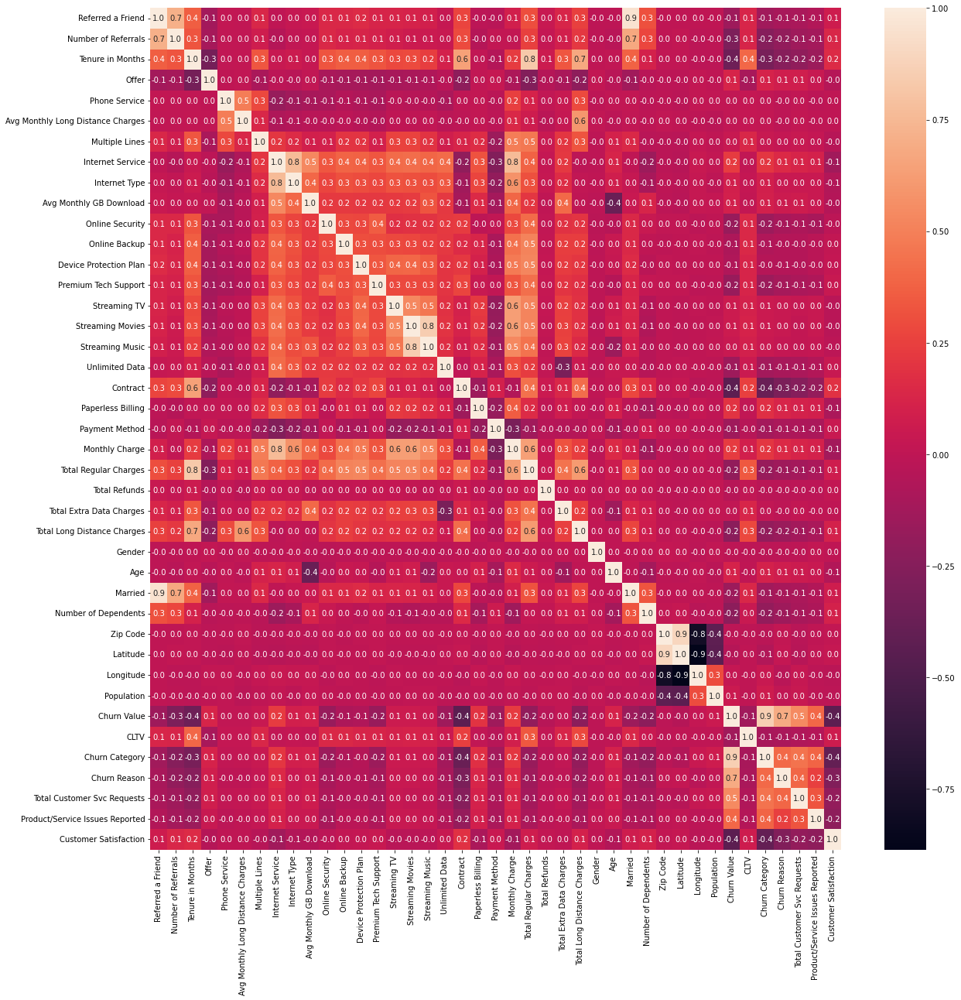

In [32]:
plt.tight_layout()
plt.subplots(figsize=(20,20))
sns.heatmap(df_clean.corr(), annot=True, fmt='.1f')

In [33]:
#df_clean[df_clean['Age'] == 65][['Age','Senior Citizen']]

In [34]:
# Scale dataframe
df_norm = (df_clean - df_clean.mean()) / df_clean.std()

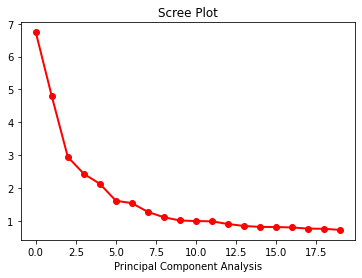

In [35]:
# initialize r to 20 components to visualize Scree Plot first
pca = PCA(n_components = 20, random_state = 42)
pca.fit_transform(df_norm)
# Scree Plot
plt.plot(pca.explained_variance_, 'ro-', linewidth=2)
plt.title('Scree Plot')
plt.xlabel('Principal Component Analysis')
plt.show()

In [36]:
# Draw a cumulative sum to decide how many to keep 
np.cumsum(pca.explained_variance_ratio_)

array([0.1644471 , 0.28131084, 0.35310188, 0.4124016 , 0.46424793,
       0.50356417, 0.54105027, 0.5720512 , 0.59907129, 0.6236999 ,
       0.64791467, 0.671911  , 0.69391559, 0.7144539 , 0.73434008,
       0.75409989, 0.77354679, 0.79214295, 0.81060817, 0.82823602])

In [37]:
# all components
pca.explained_variance_ratio_.sum()

0.8282360185254121

In [38]:
# Choose 6 component since it represents 0.50356417 ratio, 50% >
pca = PCA(n_components = 6, random_state = 42)
components = pca.fit_transform(df_norm)

In [39]:
# Draw a cumulative sum to decide how many to keep 
np.cumsum(pca.explained_variance_ratio_)

array([0.1644471 , 0.28131084, 0.35310154, 0.41240055, 0.46424497,
       0.50348884])

In [40]:
# kmeans inertia check
inertias = [] 
for i in range(1, 11):
    kmeans = KMeans(n_clusters = i, init='k-means++', random_state=42).fit(components)
    inertias.append(kmeans.inertia_)
print(inertias)

[145368.30557552614, 111102.90589556083, 88615.90001372648, 75361.83873266271, 69570.05819805483, 64920.22304755075, 60681.027909175216, 56947.28615431721, 53303.61792327803, 50323.654634867606]


Text(0.5, 1.0, 'Inertia Score by n cluster centers')

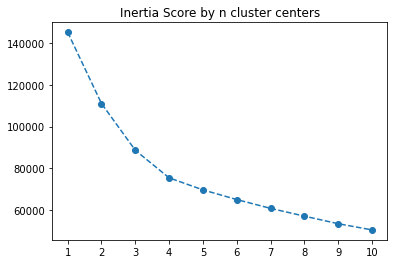

In [41]:
plt.plot(list(range(1, 11)), inertias, '--o')
plt.xticks(list(range(1, 11)), list(range(1, 11)))
plt.title('Inertia Score by n cluster centers')

In [42]:
# kmeans
kmeans = KMeans(n_clusters = 4, random_state = 42).fit(components)
#df_clean['cluster'] = kmeans.labels_
np.unique(kmeans.labels_)

array([0, 1, 2, 3], dtype=int32)

In [43]:
# dbscan
dbscan = DBSCAN(eps=2, min_samples=3).fit(components)
np.unique(dbscan.labels_)

array([-1,  0,  1,  2])

In [44]:
df['kmeans'] = kmeans.labels_

In [45]:
df['dbscan'] = dbscan.labels_

In [46]:
# check noise
len(df[dbscan.labels_[:] == -1])

23

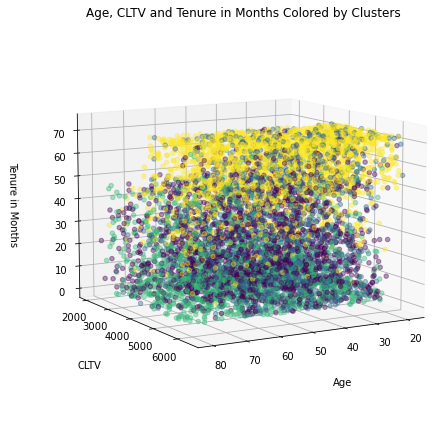

In [47]:
plt.figure(figsize = (6,6))
ax = plt.axes(projection = '3d')
ax.scatter3D(df['Age'], df['CLTV'], df['Tenure in Months'], c = df['kmeans'], alpha = 0.4)
ax.set_xlabel('Age', labelpad = 20)
ax.set_ylabel('CLTV', labelpad = 20)
ax.set_zlabel('Tenure in Months', labelpad = 20)
ax.view_init(10, 60)
plt.title('Age, CLTV and Tenure in Months Colored by Clusters')
plt.tight_layout();

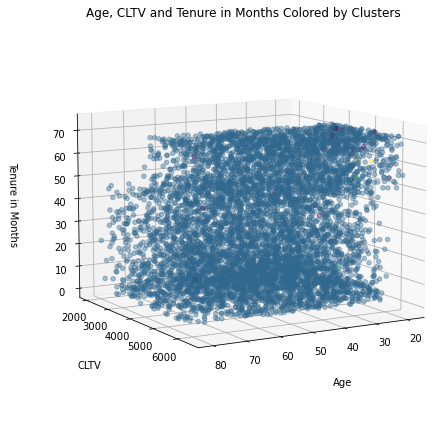

In [48]:
plt.figure(figsize = (6,6))
ax = plt.axes(projection = '3d')
ax.scatter3D(df['Age'], df['CLTV'], df['Tenure in Months'], c = df['dbscan'], alpha = 0.4)
ax.set_xlabel('Age', labelpad = 20)
ax.set_ylabel('CLTV', labelpad = 20)
ax.set_zlabel('Tenure in Months', labelpad = 20)
ax.view_init(10, 60)
plt.title('Age, CLTV and Tenure in Months Colored by Clusters')
plt.tight_layout();

In [49]:
px.scatter_3d(data_frame=df, x = 'Age', y = 'CLTV', z = 'Tenure in Months', color = 'kmeans')

In [50]:
px.scatter_3d(data_frame=df, x = 'Total Regular Charges',
              y = 'Total Extra Data Charges', z = 'Total Long Distance Charges', color = 'kmeans',
               title='Charges by Clusters',
           labels={"kmeans":"Clusters"})

In [51]:
px.scatter_3d(data_frame=df, x = 'Total Regular Charges',
              y = 'Total Extra Data Charges', z = 'Total Long Distance Charges', color = 'dbscan')

In [52]:
#plt.figure(figsize = (6,6))
#ax = plt.axes(projection = '3d')
#ax.scatter3D(df[:, 0], df[:, 1], df[:, 2], c = df['kmeans'])
#ax.set_xlabel('X')
#ax.set_ylabel('Y')
#ax.set_zlabel('Z')
#plt.title('Dataset with 4 Clusters')
#plt.tight_layout();

In [53]:
px.scatter_3d(data_frame=df, x = 'Age', y = 'Churn Value', z = 'Contract', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

In [54]:
px.scatter_3d(data_frame=df, x = 'Gender', y = 'Churn Value', z = 'Number of Dependents', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

In [55]:
px.scatter_3d(data_frame=df, x = 'CLTV', y = 'Churn Value', z = 'Monthly Charge', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

In [56]:
px.scatter_3d(data_frame=df, x = 'Total Customer Svc Requests', y = 'Churn Value', z = 'Product/Service Issues Reported', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

In [57]:
px.scatter_3d(data_frame=df, x = 'Tenure in Months', y = 'Churn Value', z = 'Customer Satisfaction', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

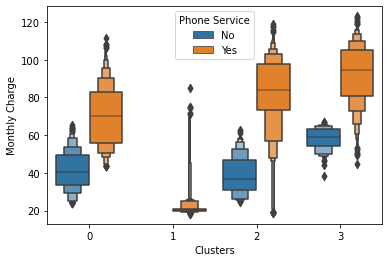

In [58]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Phone Service')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

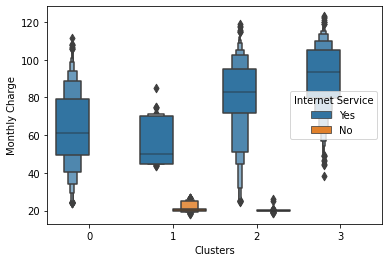

In [59]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Internet Service')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

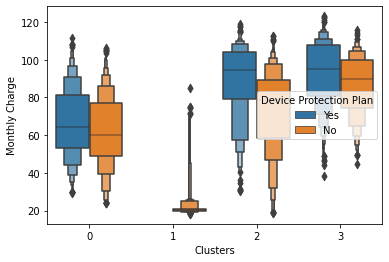

In [60]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Device Protection Plan')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

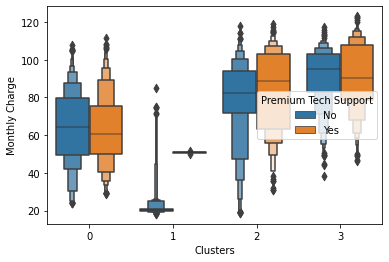

In [61]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Premium Tech Support')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

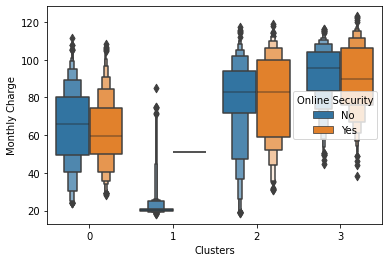

In [62]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Online Security')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

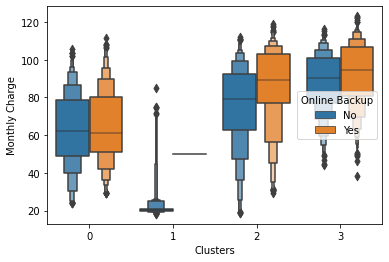

In [63]:
plt.tight_layout()
plt.subplots(figsize=(6,4))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Online Backup')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

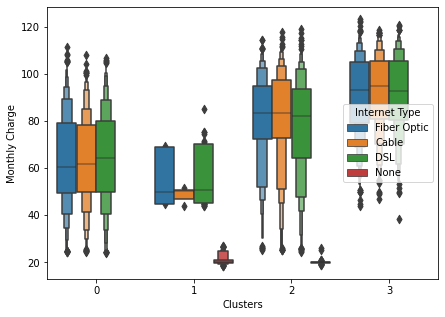

In [64]:
plt.tight_layout()
plt.subplots(figsize=(7,5))
sns.boxenplot(data=df, x='kmeans', y='Monthly Charge', hue='Internet Type')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

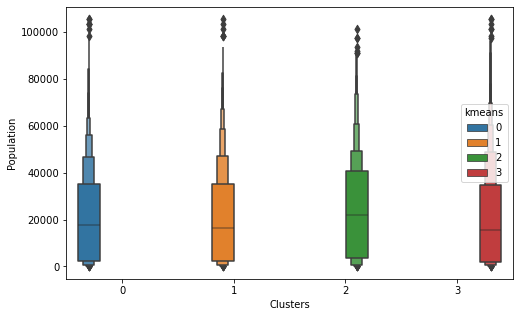

In [65]:
plt.tight_layout()
plt.subplots(figsize=(8,5))
sns.boxenplot(data=df, x='kmeans', y='Population', hue='kmeans')
plt.xlabel('Clusters')

Text(0.5, 0, 'Clusters')

<Figure size 432x288 with 0 Axes>

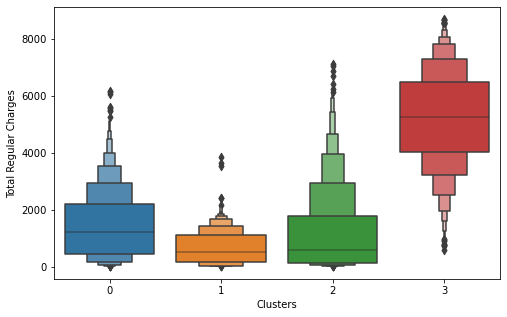

In [66]:
plt.tight_layout()
plt.subplots(figsize=(8,5))
sns.boxenplot(data=df, x='kmeans', y='Total Regular Charges')
plt.xlabel('Clusters')

In [67]:
px.scatter_3d(data_frame=df, x = 'Age', y = 'Total Regular Charges', z = 'Tenure in Months', color = 'kmeans',
                          title='Regular Charges by Clusters',
                          labels={"kmeans":"Clusters"})

In [68]:
px.scatter_3d(data_frame=df, x = 'Contract', y = 'Churn Value', z = 'Customer Satisfaction', color = 'kmeans',
             title='Churn by Clusters',
           labels={"Churn Value":"Churn", "kmeans":"Clusters"})

In [69]:
#copy df
df_num = df_clean

In [70]:
# populate cluster column from df['kmeans'] after setting index to 'Customer ID'
df_num['cluster'] = df.set_index('Customer ID')['kmeans']

In [71]:
# analyze all data points from df_clean -> df_num
round(df_num.groupby('cluster').mean(),2)

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Married,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.29,1.29,22.89,1.61,0.76,17.97,0.26,1.00,2.18,26.08,0.35,0.34,0.31,0.33,0.31,0.30,0.28,0.62,6.63,0.60,1.49,63.54,1444.35,2.09,122.96,338.59,0.51,46.13,0.31,0.40,93483.88,36.23,-119.76,21500.77,0.03,4126.60,1.03,1.08,0.88,0.13,3.17
1,0.47,2.25,30.87,1.42,1.00,25.19,0.23,0.02,0.03,0.39,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,13.42,0.29,1.80,21.88,685.71,1.66,3.54,780.00,0.51,42.88,0.50,0.76,93545.86,36.36,-119.91,21516.51,0.06,4376.15,1.13,1.31,0.95,0.15,3.18
2,0.30,0.46,14.31,1.86,0.91,22.91,0.44,0.98,1.91,25.09,0.13,0.25,0.27,0.14,0.42,0.42,0.38,0.27,1.62,0.78,1.33,78.54,1183.15,1.53,200.09,327.27,0.49,50.48,0.32,0.10,93392.75,35.97,-119.62,24328.19,1.00,4056.80,3.82,6.27,2.73,0.86,2.50
3,0.74,3.57,57.52,0.80,0.96,26.26,0.72,1.00,2.18,29.08,0.57,0.69,0.70,0.59,0.73,0.75,0.68,0.54,15.87,0.68,1.41,91.13,5235.65,2.42,710.92,1473.14,0.50,46.54,0.77,0.60,93516.31,36.22,-119.74,21514.82,0.08,4967.62,1.21,1.36,0.99,0.17,3.12


In [72]:
# analyze all data points from df_clean -> df_num
df_num.groupby('cluster').median()

,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Regular Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Gender,Age,Married,Number of Dependents,Zip Code,Latitude,Longitude,Population,Churn Value,CLTV,Churn Category,Churn Reason,Total Customer Svc Requests,Product/Service Issues Reported,Customer Satisfaction
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,0.0,0.0,19.0,0.0,1.0,15.265,0.0,1.0,2.0,21.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,1.0,61.400,1211.250,0.0,0.00,153.27,1.0,46.0,0.0,0.0,93518.0,36.231895,-119.678925,17587.5,0.0,4164.5,1.0,1.0,1.0,0.0,3.005453
1,0.0,0.0,25.0,0.0,1.0,25.535,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,12.0,0.0,2.0,20.150,537.775,0.0,0.00,495.71,1.0,43.0,0.0,0.0,93626.5,36.624641,-119.930027,16597.0,0.0,4479.5,1.0,1.0,1.0,0.0,3.005453
2,0.0,0.0,8.0,0.0,1.0,22.480,0.0,1.0,2.0,22.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,82.784,606.250,0.0,34.00,119.45,0.0,51.0,0.0,0.0,93244.0,35.215731,-119.140338,21739.0,1.0,4123.0,4.0,4.0,3.0,0.0,3.005453
3,1.0,2.0,62.0,0.0,1.0,27.480,1.0,1.0,2.0,23.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,12.0,1.0,1.0,93.525,5277.125,0.0,129.44,1432.35,1.0,46.0,1.0,0.0,93511.0,36.219313,-119.509412,15505.0,0.0,5042.0,1.0,1.0,1.0,0.0,3.005453


In [73]:
kmeans.cluster_centers_

array([[-0.34732183,  0.03397598, -0.11855136,  1.63081049,  0.02804978,
        -0.287961  ],
       [-2.75677345, -2.52368026,  0.15415273, -0.85864993, -0.29018939,
         0.28628472],
       [-1.04880558,  3.12299574, -0.02864122, -0.96357012,  0.45090796,
        -0.01918267],
       [ 3.33509348, -0.56461776,  0.02149602, -0.19353865, -0.16251956,
         0.08062178]])

In [74]:
components

array([[-1.99528975,  3.83565483,  2.27284518,  0.87961352,  1.2461053 ,
        -1.15120721],
       [-1.12443275,  2.49893349,  2.56184874, -2.72110395,  1.05765117,
        -0.73907613],
       [ 0.49375705,  3.82237286,  2.02396385,  0.47942054,  0.45360038,
        -0.48165587],
       ...,
       [ 5.77921116, -0.89388166,  1.65921924, -1.58382102,  0.23817718,
         4.02594482],
       [-1.44228355, -1.0036644 ,  1.15092368,  2.69262664,  3.1560447 ,
        -0.93721847],
       [ 3.83637925,  0.74388241,  1.17503544,  0.85252974, -2.34473221,
        -0.43444311]])

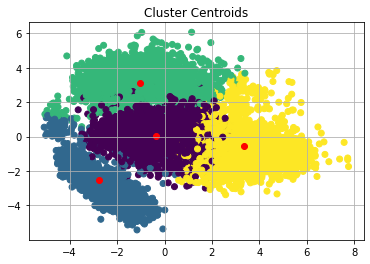

In [75]:
plt.title('Cluster Centroids')
plt.scatter(components[:, 0], components[:, 1], c = df['kmeans'])
plt.scatter(kmeans.cluster_centers_[:,0], kmeans.cluster_centers_[:,1], c='r')
plt.grid()